In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from tabulate import tabulate
import iexfinance as iex
import chart_studio.plotly as py
from iexfinance.refdata import get_symbols
from iexfinance.stocks import get_historical_data
import plotly.graph_objects as go
from scipy import stats
from scipy.stats import zscore
%matplotlib inline

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
df = pd.read_csv("trump_tweets.csv") 
df.head()

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str
0,Twitter for iPhone,LOUISIANA — Tomorrow you will head to the poll...,10/12/2019 3:49,9706,35425,False,1.182870e+18
1,Twitter for iPhone,Louisiana REPUBLICANS thank you for a great ev...,10/12/2019 3:48,10626,40844,False,1.182870e+18
2,Twitter for iPhone,“I never saw so many subpoenas!” @ShannonBream...,10/12/2019 3:25,15523,56841,False,1.182860e+18
3,Twitter for iPhone,So funny to watch Steve Kerr grovel and pander...,10/12/2019 3:25,20293,99524,False,1.182860e+18
4,Twitter for iPhone,WHERE’S HUNTER?,10/12/2019 2:58,26280,110222,False,1.182850e+18


In [2]:
sentiment = df.apply(lambda x : analyzer.polarity_scores(x['text']), axis=1)
df['Compound'] =sentiment.apply(lambda x : x.get('compound') )
df = df.drop(columns=["source","id_str"])
df['created_at'] = pd.to_datetime(df['created_at'])
df = df.rename(columns={'created_at': 'Date'})
df = df[~df['text'].str.contains("RT @")]
df


,text,Date,retweet_count,favorite_count,is_retweet,Compound
0,LOUISIANA — Tomorrow you will head to the poll...,2019-10-12 03:49:00,9706,35425,False,0.6892
1,Louisiana REPUBLICANS thank you for a great ev...,2019-10-12 03:48:00,10626,40844,False,0.8945
2,“I never saw so many subpoenas!” @ShannonBream...,2019-10-12 03:25:00,15523,56841,False,-0.9284
3,So funny to watch Steve Kerr grovel and pander...,2019-10-12 03:25:00,20293,99524,False,-0.5266
4,WHERE’S HUNTER?,2019-10-12 02:58:00,26280,110222,False,0.0000
...,...,...,...,...,...,...
15248,Well the year has officially begun. I have man...,2016-01-01 23:00:00,2642,8495,False,0.6325
15249,@sprinklermanus: @CNN @realDonaldTrump they're...,2016-01-01 21:29:00,933,3330,False,0.7351
15250,@jallenaip: Hillary said she was in a Fog of W...,2016-01-01 06:08:00,2721,7490,False,-0.8478
15251,Happy New Year from #MarALago! Thank you to my...,2016-01-01 06:07:00,1948,8258,False,0.9230


In [3]:
#df.to_csv('trump_tweeets_with_sentiment.csv')

In [4]:
df_china = df[(df['text'].str.contains("tariffs")) | (df['text'].str.contains("Tariffs"))]
df_china = df_china[(df_china['Compound'] < -0.5) | (df_china['Compound'] > 0.5)]
df_china


,text,Date,retweet_count,favorite_count,is_retweet,Compound
213,.@60Minutes “forgot” to report that we are hel...,2019-10-06 23:54:00,20112,71366,False,0.8553
374,The U.S. won a $7.5 Billion award from the Wor...,2019-10-03 10:00:00,25811,109082,False,0.7845
929,....on October 1st we have agreed as a gesture...,2019-09-11 23:17:00,10299,51280,False,0.7906
1161,“Brazil will allow more American Ethanol to en...,2019-09-03 02:37:00,14075,67742,False,0.6808
1167,“Brazil will allow more American Ethanol to en...,2019-09-02 21:58:00,5539,21596,False,0.6808
...,...,...,...,...,...,...
8118,Very thankful for President Xi of China’s kind...,2018-04-10 18:30:00,22531,106429,False,0.9577
8140,The United States hasn’t had a Trade Surplus w...,2018-04-07 18:03:00,22193,90487,False,-0.6996
8292,The European Union wonderful countries who tre...,2018-03-10 21:29:00,23972,99649,False,-0.7470
8302,Spoke to PM @TurnbullMalcolm of Australia. He ...,2018-03-09 22:48:00,17200,78494,False,0.9144


In [9]:
df_closing_price = pd.read_csv("closing_price_data.csv") 
df_closing_price['Date'] = pd.to_datetime(df_closing_price['Date'])
df_closing_price

,Date,SPY,SOXX,SOYB,CARZ
0,2016-01-04,201.020004,88.800003,17.230000,35.230000
1,2016-01-05,201.360001,87.959999,17.190001,35.020000
2,2016-01-06,198.820007,84.919998,17.260000,33.830002
3,2016-01-07,194.050003,82.540001,17.320000,32.950001
4,2016-01-08,191.919998,81.349998,17.330000,32.750000
...,...,...,...,...,...
946,2019-10-07,293.079987,212.240005,15.680000,31.139999
947,2019-10-08,288.529999,205.669998,15.730000,30.900000
948,2019-10-09,291.269989,209.029999,15.780000,31.139999
949,2019-10-10,293.239990,211.070007,15.790000,31.389999


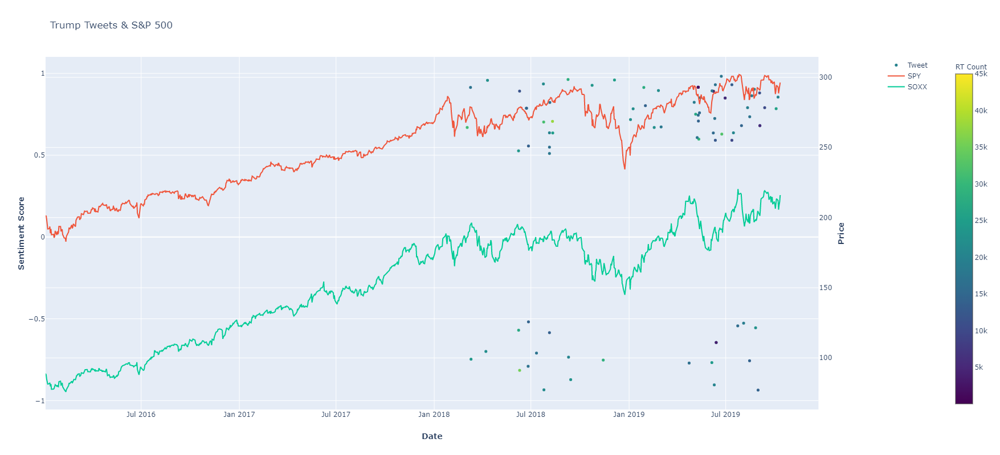

In [10]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(
    x = df_china.Date, 
    y = df_china.Compound, 
    name="Tweet", 
    mode = 'markers', 
        marker=dict(
        size=5,
        cmax=45000,
        cmin=50,
        color=df_china.retweet_count,
        colorbar=dict(
            title="RT Count",x=1.1
        ),
        colorscale="Viridis"
    ),
    hovertext=df_china.text),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x = df_closing_price['Date'], y=df_closing_price['SPY'], name="SPY"),
    secondary_y=True,
)

fig.add_trace(
    go.Scatter(x = df_closing_price.Date, y=df_closing_price['SOXX'], name="SOXX"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Trump Tweets & S&P 500",
    width=1600,
    height=800,
)


# Set x-axis title
fig.update_xaxes(title_text="<b>Date</b>")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Sentiment Score</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Price</b>", secondary_y=True)

fig.show()



In [11]:
df_wework = pd.read_csv("wework2.csv") 
df_wework = df_wework.drop(['Unnamed: 0'], axis=1)
df_wework = df_wework[(df_wework['text'].str.contains("wework")) | (df_wework['text'].str.contains("WeWork")) ]
df_wework = df_wework[(df_wework['text'].str.contains("IPO")) | (df_wework['text'].str.contains("ipo")) ]
df_wework

,is_retweet,likes,retweets,text,timestamp,username
9,0,0,0,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:39:15,MarilynOliva
16,0,1,1,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:25:18,RezaC1
22,0,0,2,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:12:05,jeralynpasinabo
23,0,0,0,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:12:05,JeanCaragher
24,0,0,2,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:12:05,HAUPOLD
...,...,...,...,...,...,...
80034,0,0,0,WeWork CEO Adam Neumann has reportedly cashed ...,2019-07-19 01:40:09,BetaDroidIndia
80035,0,0,0,WeWork CEO Adam Neumann has reportedly cashed ...,2019-07-19 01:39:08,Browsify
80036,0,0,0,WeWork CEO Adam Neumann has reportedly cashed ...,2019-07-19 01:39:03,usalivefeed
80040,0,26,8,WeWork co-founder Adam Neumann has cashed out ...,2019-07-19 01:36:23,HiddenForcesPod


In [12]:
sentiment = df_wework.apply(lambda x : analyzer.polarity_scores(x['text']), axis=1)
df_wework['Compound'] =sentiment.apply(lambda x : x.get('compound') )
df_wework['timestamp'] = pd.to_datetime(df_wework['timestamp'])
df_wework = df_wework.rename(columns={'timestamp': 'Date'})
df_wework = df_wework[~df_wework['text'].str.contains("RT @")]
df_wework = df_wework.reset_index(drop=True)
df_wework


,is_retweet,likes,retweets,text,Date,username,Compound
0,0,0,0,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:39:15,MarilynOliva,0.0
1,0,1,1,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:25:18,RezaC1,0.0
2,0,0,2,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:12:05,jeralynpasinabo,0.0
3,0,0,0,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:12:05,JeanCaragher,0.0
4,0,0,2,"Peloton, WeWork, and Postmates Are Coming Down...",2019-06-06 23:12:05,HAUPOLD,0.0
...,...,...,...,...,...,...,...
10932,0,0,0,WeWork CEO Adam Neumann has reportedly cashed ...,2019-07-19 01:40:09,BetaDroidIndia,0.0
10933,0,0,0,WeWork CEO Adam Neumann has reportedly cashed ...,2019-07-19 01:39:08,Browsify,0.0
10934,0,0,0,WeWork CEO Adam Neumann has reportedly cashed ...,2019-07-19 01:39:03,usalivefeed,0.0
10935,0,26,8,WeWork co-founder Adam Neumann has cashed out ...,2019-07-19 01:36:23,HiddenForcesPod,0.0


In [13]:
df_wework.max()

is_retweet                                                    0
likes                                                      2733
retweets                                                    563
text          ��  Exclusive: US Video Business - WeWork to r...
Date                                        2019-10-13 23:16:50
username                                                 zysman
Compound                                                 0.9552
dtype: object

In [14]:
wework_bond_price = pd.read_csv("wework_bond.csv") 
wework_bond_price['Date'] = pd.to_datetime(wework_bond_price['Date'])
wework_bond_price = wework_bond_price[(wework_bond_price['Date'] > '2019-6-4')]
wework_bond_price

,Date,The We Company - SR GLBL 144A 25 - Bond Price
278,2019-06-05,92.875
279,2019-06-06,93.500
280,2019-06-07,93.750
281,2019-06-10,95.000
282,2019-06-11,94.750
...,...,...
366,2019-10-09,81.750
367,2019-10-10,81.250
368,2019-10-11,90.500
369,2019-10-14,87.000


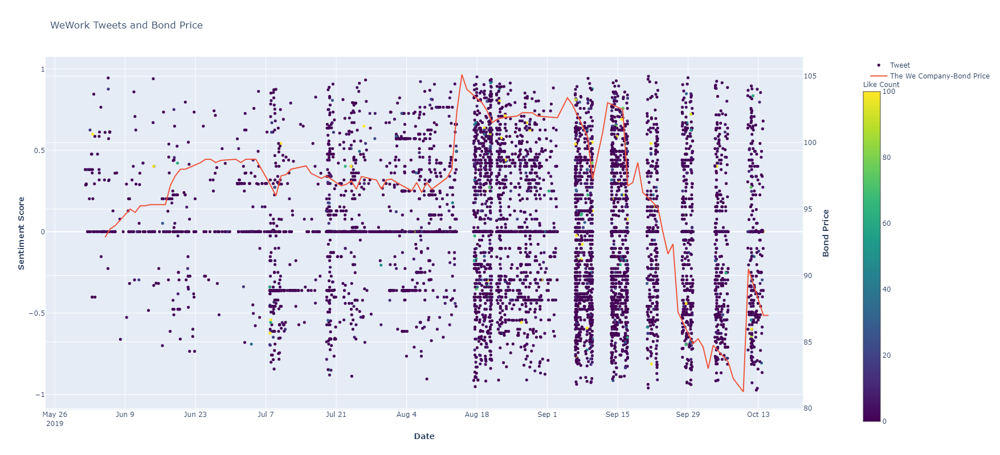

In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(
    x = df_wework.Date, 
    y = df_wework.Compound, 
    name="Tweet", 
    mode = 'markers', 
        marker=dict(
        size=5,
        cmax=100,
        cmin=0,
        color=df_wework.likes,
        colorbar=dict(
            title="Like Count",x=1.008,y=0.45
        ),
        colorscale="Viridis"
    ),
    hovertext=df_wework.text),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x = wework_bond_price.Date, y=wework_bond_price['The We Company - SR GLBL 144A 25 - Bond Price'], name="The We Company-Bond Price"),
    secondary_y=True,
)


# Add figure title
fig.update_layout(
    title_text="WeWork Tweets and Bond Price",
    width=1600,
    height=800,
)


# Set x-axis title
fig.update_xaxes(title_text="<b>Date</b>")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Sentiment Score</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Bond Price</b>", secondary_y=True)

fig.show()



In [16]:
df_musk = pd.read_csv("elon_all.csv") 
df_musk = df_musk.drop_duplicates(subset='text', keep="first")
df_musk = df_musk[(df_musk['is_retweet'] < 1)]
df_musk = df_musk[(df_musk['text'].str.contains("tesla")) | (df_musk['text'].str.contains("Tesla")) ]
df_musk = df_musk.drop(['Unnamed: 0'], axis=1)
df_musk = df_musk.rename(columns={'timestamp': 'Date'})
df_musk['Date'] = pd.to_datetime(df_musk['Date'])
df_musk.sort_values(by=['Date'], inplace=True, ascending=False)
df_musk = df_musk.reset_index(drop=True)
df_musk

,username,Date,retweets,likes,is_retweet,text
0,elonmusk,2019-10-12 01:16:48,265,3098,0,V important: pure solar subscription is guaran...
1,elonmusk,2019-10-12 01:01:26,791,14294,0,"Now that Tesla V10.0 with Smart Summon is out,..."
2,elonmusk,2019-10-12 00:18:22,2235,22380,0,Get Tesla Solar plus Powerwall battery for 24/...
3,elonmusk,2019-10-10 00:25:22,1215,20749,0,Also adding Tesla Solar to our Supercharger st...
4,elonmusk,2019-10-10 00:23:28,1682,28752,0,All Tesla Supercharger stations in regions aff...
...,...,...,...,...,...,...
608,elonmusk,2013-02-11 19:41:29,367,172,0,Tesla data logging is only turned on with expl...
609,elonmusk,2013-02-11 19:30:14,201,87,0,Tesla blog coming soon detailing what actually...
610,elonmusk,2013-02-11 19:26:30,964,262,0,NYTimes article about Tesla range in cold is f...
611,elonmusk,2013-01-18 17:24:36,583,245,0,"Maybe already under control, but Tesla & Space..."


In [17]:
sentiment = df_musk.apply(lambda x : analyzer.polarity_scores(x['text']), axis=1)
df_musk['Compound'] =sentiment.apply(lambda x : x.get('compound') )
df_musk = df_musk[(df_musk['Compound'] < -0.4) | (df_musk['Compound'] > 0.4)]
df_musk = df_musk[(df_musk['Date'] > '2017-1-1')]
df_musk = df_musk.reset_index(drop=True)
df_musk


,username,Date,retweets,likes,is_retweet,text,Compound
0,elonmusk,2019-10-12 01:01:26,791,14294,0,"Now that Tesla V10.0 with Smart Summon is out,...",0.6124
1,elonmusk,2019-10-02 22:16:45,2260,50511,0,"Over 550,000 Tesla Smart Summon uses in first ...",0.4574
2,elonmusk,2019-10-02 22:12:57,223,3625,0,"Thanks, Tesla team is the strongest it’s ever ...",0.9286
3,elonmusk,2019-09-27 18:55:21,538,10271,0,Summon is improving rapidlyhttps://www.reddit....,0.4215
4,elonmusk,2019-09-23 17:44:14,524,3637,0,"Hoping to open in Slovakia, Croatia, Serbia & ...",0.7345
...,...,...,...,...,...,...,...
236,elonmusk,2017-03-10 02:50:57,6459,15724,0,Tesla will get the system installed and workin...,0.4588
237,elonmusk,2017-02-23 12:22:31,865,3817,0,Excellent Tesla Model X review http://www.chic...,0.5719
238,elonmusk,2017-02-15 21:05:03,14810,50195,0,"In appreciation, Tesla is providing all repair...",0.7650
239,elonmusk,2017-02-11 02:18:03,87,747,0,Sounds like the Tesla Powerwall (consumer) and...,0.6597


In [18]:
df_musk.max()

username                                               elonmusk
Date                                        2019-10-12 01:01:26
retweets                                                  27241
likes                                                    172307
is_retweet                                                    0
text          “Virtue signaling” is super annoying & there a...
Compound                                                 0.9719
dtype: object

In [19]:
tsla_price = pd.read_csv("TSLA.csv") 
tsla_price['Date'] = pd.to_datetime(tsla_price['Date'])
tsla_price = tsla_price[(tsla_price['Date'] > '2017-1-1')]
tsla_price = tsla_price.reset_index(drop=True)
tsla_price

,Date,TSLA
0,2017-01-03,216.990005
1,2017-01-04,226.990005
2,2017-01-05,226.750000
3,2017-01-06,229.009995
4,2017-01-09,231.279999
...,...,...
696,2019-10-09,244.529999
697,2019-10-10,244.740005
698,2019-10-11,247.889999
699,2019-10-14,256.959991


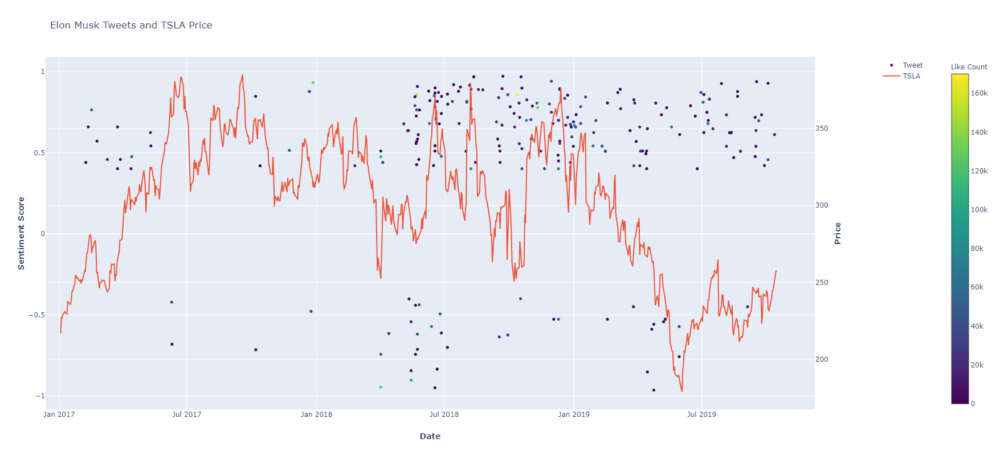

In [20]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(
    x = df_musk.Date, 
    y = df_musk.Compound, 
    name="Tweet", 
    mode = 'markers', 
        marker=dict(
        size=5,
        cmax=170000,
        cmin=0,
        color=df_musk.likes,
        colorbar=dict(
            title="Like Count",x=1.1
        ),
        colorscale="Viridis"
    ),
    hovertext=df_musk.text),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x = tsla_price.Date, y=tsla_price['TSLA'], name="TSLA"),
    secondary_y=True,
)


# Add figure title
fig.update_layout(
    title_text="Elon Musk Tweets and TSLA Price",
    width=1600,
    height=800,
)


# Set x-axis title
fig.update_xaxes(title_text="<b>Date</b>")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Sentiment Score</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Price</b>", secondary_y=True)

fig.show()

